In [1]:
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras import initializers
from tensorflow.keras.utils import to_categorical,plot_model

from tensorflow.keras.models import Sequential, Model, load_model
import tensorflow.keras.layers as layers

# for data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping

from skimage.transform import resize
import cv2

from PIL import Image
import os
from shutil import copyfile

# for VGG
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import decode_predictions
from tensorflow.keras.applications.vgg16 import VGG16

# 1. Load the data and convert labels to one-hot encoded labels

In [2]:
# Load the dataset

#Choose the categories of images to be classified
category_names=['agricultural',
                'forest',
                'mobilehomepark',
                'overpass',
                'parkinglot',
                'river',
                'runway',
                'sparseresidential']

Image_dir='data/UCMerced_LandUse/Images'

num_images=100 # in each category
num_classes=len(category_names)
patch_size=256 # size of each image
num_channels=3 # since they are color images

images_orig=[]
labels_num=[]

for i in range(len(category_names)):
    for j in range(num_images):
        
        img_path=os.path.join(
            Image_dir,category_names[i],
            category_names[i]+'{:02d}.tif'.format(j))
        new_image=Image.open(img_path)
        
        # resize the image
        
        resized_image=new_image.resize((224,224),Image.ANTIALIAS)
        arr=np.asarray(resized_image)
        
        images_orig.append(arr)
        labels_num.append([i])

# Normalization
images_orig=(np.array(images_orig)).astype('float32')
images_orig/=255
labels_num=np.array(labels_num)

print('Images Shape = {}'.format(images_orig.shape))
print('Labels Shape = {}'.format(labels_num.shape))

# Save the extracted dataset for future use
np.save('data/UCMerced_images_orig_8Class_normalized.npy',images_orig)
np.save('data/UCMerced_labels_num_8Class_normalized.npy',labels_num)

Images Shape = (800, 224, 224, 3)
Labels Shape = (800, 1)


In [3]:
# Convert the labels to one-hot encoded labels

labels=to_categorical(labels_num, num_classes)

# take a look at the one-hot encoded labels
print('One-hot encoded labels include:')
for i in range(num_classes):
    print(labels[i*num_images])
    
print('\nOne-hot encoded Labels Shape = {}'.format(labels.shape))

One-hot encoded labels include:
[1. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 0. 0. 0. 0.]
[0. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 1. 0. 0. 0. 0.]
[0. 0. 0. 0. 1. 0. 0. 0.]
[0. 0. 0. 0. 0. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 1.]

One-hot encoded Labels Shape = (800, 8)


# 2. Split train, val and test

In [4]:
tot_images=images_orig.shape[0] #total number of images

# train/test split
x_train, x_test, y_train, y_test=train_test_split(
    images_orig,labels,test_size=0.2,
    stratify=labels,random_state=999)

# split part of data in train set to be valudation set
x_train, x_val, y_train, y_val=train_test_split(
    x_train,y_train,test_size=0.25,
    stratify=y_train,random_state=666)

# 3. CNN Transfer Model - VGG

In [5]:
model_VGG=VGG16(include_top=False, input_shape=(224,224,3))
for layer in model_VGG.layers:
    layer.trainable=False

# define the dense layers to be trained
flat_layer=layers.Flatten()(model_VGG.layers[-1].output)
dense_layer=layers.Dense(1024, activation='relu')(flat_layer)
output_layer=layers.Dense(8, activation='softmax')(dense_layer)

# define the new model
model_VGG=Model(inputs=model_VGG.inputs,outputs=output_layer)

# see how the model looks
model_VGG.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

# 4. Train the top

In [8]:
epochs = 10
learning_rate=0.0001
batch_size = 32

batches_per_epoch = y_train.shape[0]//batch_size
validation_steps = y_val.shape[0]//batch_size

# data augmentation

# for the training data
image_gen = ImageDataGenerator(zoom_range = 0.1,
                               width_shift_range=5,   # pixel
                               height_shift_range=5,  # pixel
                               horizontal_flip=True,
                               vertical_flip=True,
                               rotation_range=20)

# for validation/ test data (keep the original data)
image_gen_test=ImageDataGenerator()

# put data into the augmentation generators
train_gen=image_gen.flow(np.array(x_train), y_train,
                         batch_size=batch_size, shuffle = True)
val_gen=image_gen_test.flow(np.array(x_val), y_val,
                            batch_size=batch_size, shuffle=True)

In [9]:
# Define an optimizer
opt = Adam(lr=learning_rate)

model_VGG.compile(optimizer=opt, loss='categorical_crossentropy',
                  metrics=['accuracy'])    

checkpt_best_model='model/8Class_3Conv2Den_dataAugm.hdf5'

mc=ModelCheckpoint(checkpt_best_model,monitor='val_accuracy',
                   mode='max', verbose=1, save_best_only=True)

# Fit the model parameters
print('training...')

history = model_VGG.fit(x=train_gen,
                        steps_per_epoch=batches_per_epoch, 
                        epochs=epochs,
                        validation_data=val_gen,
                        validation_steps=validation_steps,
                        callbacks=[mc],
                        verbose=2)

print('done')

training...
Epoch 1/10
15/15 - 101s - loss: 0.2644 - accuracy: 0.9021 - val_loss: 0.1588 - val_accuracy: 0.9500
Epoch 2/10
15/15 - 107s - loss: 0.0987 - accuracy: 0.9688 - val_loss: 0.1189 - val_accuracy: 0.9500
Epoch 3/10
15/15 - 111s - loss: 0.0747 - accuracy: 0.9750 - val_loss: 0.1063 - val_accuracy: 0.9750
Epoch 4/10
15/15 - 115s - loss: 0.0617 - accuracy: 0.9854 - val_loss: 0.1071 - val_accuracy: 0.9812
Epoch 5/10
15/15 - 107s - loss: 0.0395 - accuracy: 0.9854 - val_loss: 0.1069 - val_accuracy: 0.9688
Epoch 6/10
15/15 - 80s - loss: 0.0337 - accuracy: 0.9917 - val_loss: 0.1144 - val_accuracy: 0.9625
Epoch 7/10
15/15 - 85s - loss: 0.0365 - accuracy: 0.9917 - val_loss: 0.0886 - val_accuracy: 0.9750
Epoch 8/10
15/15 - 81s - loss: 0.0263 - accuracy: 0.9937 - val_loss: 0.1295 - val_accuracy: 0.9500
Epoch 9/10
15/15 - 82s - loss: 0.0246 - accuracy: 0.9917 - val_loss: 0.1074 - val_accuracy: 0.9688
Epoch 10/10
15/15 - 82s - loss: 0.0329 - accuracy: 0.9917 - val_loss: 0.1444 - val_accuracy:

In [10]:
def history_plot(model_id,history):
    plt.figure(figsize=(8,10))
    
    # plot loss
    plt.subplot(2,1,1)
    plt.title('Cross Entropy Loss -'+model_id,fontsize=12)
    plt.plot(history.history['loss'],color='blue',label='train')
    plt.plot(history.history['val_loss'],color='orange',label='val')
    plt.xlabel('Epochs',fontsize=12)
    plt.ylabel('Loss',fontsize=12)
    plt.legend(loc='upper right')
    
    # plot accuracy
    plt.subplot(2,1,2)
    plt.title('Classification Accuracy'+model_id, fontsize=10)
    plt.plot(history.history['accuracy'],color='blue',label='train')
    plt.plot(history.history['val_accuracy'],color='orange',label='val')
    plt.xlabel('Epochs',fontsize=12)
    plt.ylabel('Accuracy',fontsize=12)
    plt.legend(loc='lower right')
    
    plt.show()

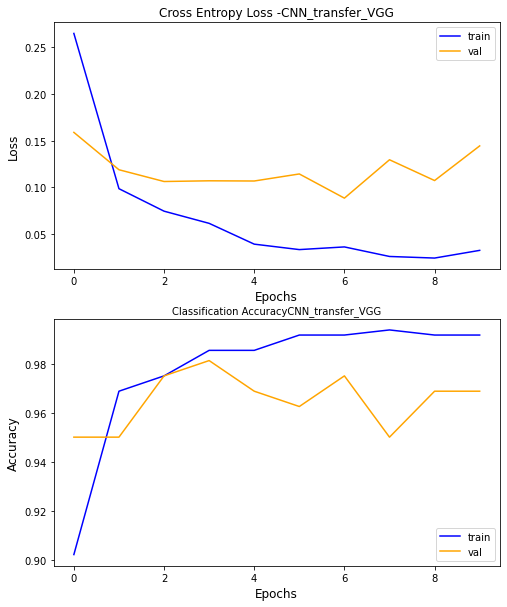

In [11]:
history_plot('CNN_transfer_VGG',history)

In [17]:
_, acc=model_VGG.evaluate(x_train,y_train,verbose=0)
print('Model evaluate on train, accuracy %.3f'%(acc*100))
_, acc=model_VGG.evaluate(x_val,y_val,verbose=0)
print('Model evaluate on val, accuracy %.3f'%(acc*100))
_, acc=model_VGG.evaluate(x_test,y_test,verbose=0)
print('Model evaluate on test, accuracy %.3f'%(acc*100))

Model evaluate on train, accuracy 98.958
Model evaluate on train, accuracy 96.875
Model evaluate on test, accuracy 97.500


# 5. Prediction on test image

In [12]:
test_gen=image_gen_test.flow(np.array(x_test),
                             batch_size=batch_size,
                             shuffle=False)
step_size_test=x_test.shape[0]//batch_size
print('predicting...')
predictions=model_VGG.predict(test_gen,steps=step_size_test)
y_pred=to_categorical(np.argmax(predictions,axis=1),num_classes)
print('done!')
print('number of predictions: ',len(predictions))

# classification report
report_str=classification_report(
    y_test,y_pred,target_names=category_names)
print(report_str)

predicting...
done!
number of predictions:  160
                   precision    recall  f1-score   support

     agricultural       1.00      0.95      0.97        20
           forest       0.91      1.00      0.95        20
   mobilehomepark       1.00      1.00      1.00        20
         overpass       1.00      1.00      1.00        20
       parkinglot       1.00      1.00      1.00        20
            river       1.00      0.85      0.92        20
           runway       1.00      1.00      1.00        20
sparseresidential       0.91      1.00      0.95        20

        micro avg       0.97      0.97      0.97       160
        macro avg       0.98      0.98      0.97       160
     weighted avg       0.98      0.97      0.97       160
      samples avg       0.97      0.97      0.97       160



In [15]:
# Confusion matrix
conf_mat=confusion_matrix(
    y_test.argmax(axis=1),predictions.argmax(axis=1))
conf_mat

array([[19,  1,  0,  0,  0,  0,  0,  0],
       [ 0, 20,  0,  0,  0,  0,  0,  0],
       [ 0,  0, 20,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 20,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 20,  0,  0,  0],
       [ 0,  1,  0,  0,  0, 17,  0,  2],
       [ 0,  0,  0,  0,  0,  0, 20,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 20]])

In [13]:
def plot_cm(y_true,y_pred,figsize=(12,10)):
    # y_true: true labels
    # y_pred: predicted labels
    cm=confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    
    cm_sum=np.sum(cm,axis=1,keepdims=True)
    cm_perc=cm/cm_sum.astype(float)*100
    annot=np.empty_like(cm).astype(str)
    
    nrows, ncols=cm.shape
    
    for i in range(nrows):
        for j in range(ncols):
            c=cm[i,j]
            p=cm_perc[i,j]
            if i==j:
                s=cm_sum[i]
                annot[i,j]='%d/%d'%(c,s)
            elif c==0:
                annot[i,j]=''
            elif i<j:
                annot[i,j]='%d'%(c)
            else:
                annot[i,j]='%d'%(c)
            
    cm=pd.DataFrame(cm,
                    index=category_names,
                    columns=category_names)
    cm.index.name='Actual'
    cm.columns.name='Predicted'
    fig,ax=plt.subplots(figsize=figsize)
    sns.set(font_scale=1.4)
    sns.heatmap(cm,cmap='YlGnBu',annot=annot,fmt='',
                ax=ax, annot_kws={'fontsize':12})

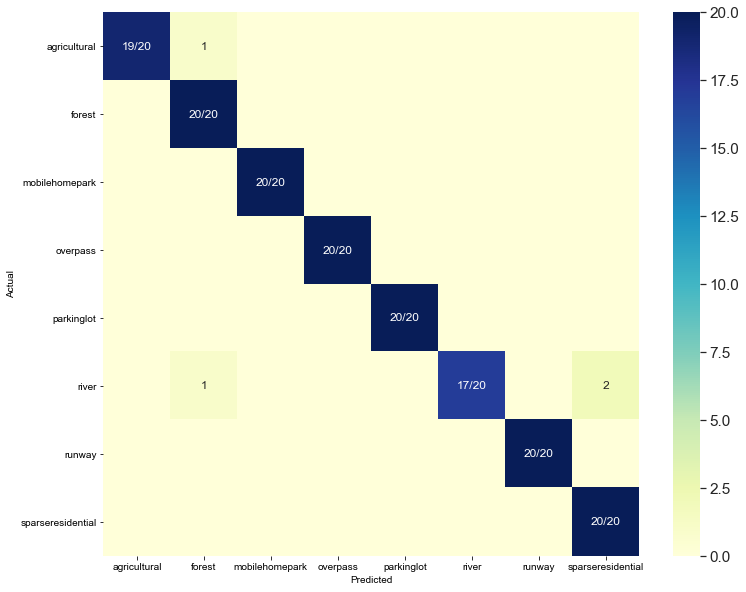

In [14]:
plot_cm(y_test.argmax(axis=1),predictions.argmax(axis=1))

In [20]:
# see how the images with predicted labels look

def plotImages_categories(images, labels, predictions,
                          n_cols=4, figsize=(10,10)):
    fig, axes=plt.subplots(
        math.ceil(len(images)/n_cols),n_cols,figsize=figsize)
    axes=axes.flatten()
    
    for i in range(
        math.ceil(len(images)/n_cols)*n_cols):
        
        axes[i].set_xticks(())
        axes[i].set_yticks(())
        
        if i < len(images):
            
            axes[i].imshow(images[i])
            
            if predictions is not None:
                title = 'LABEL:{}\nPRED:{}'.format(
                    labels[i],predictions[i])
                
                if predictions[i]!=labels[i]:
                    [j.set_linewidth(5) for j in axes[i].spines.values()]
                    [j.set_color('red') for j in axes[i].spines.values()]
                    
            else:
                title='LABEL:{}'.format(labels[i])
            axes[i].set_title(title, fontdict={'family':'monospace'},
                              loc='left',fontsize=12)
    plt.tight_layout()
    plt.show()


Category:agricultural, Total Samples:20


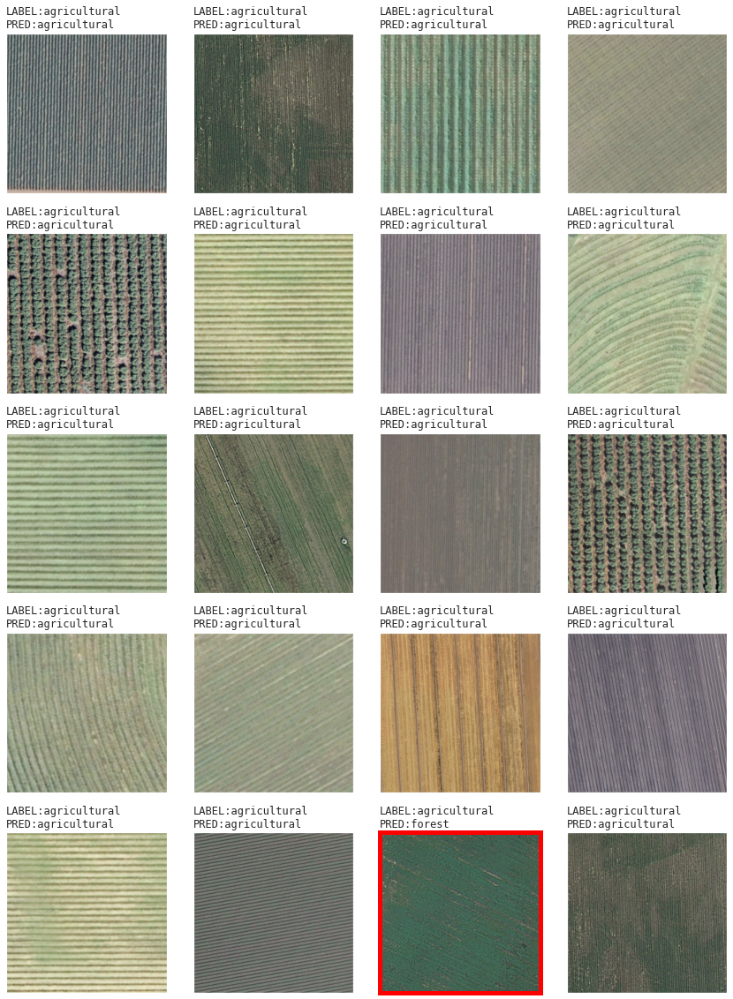


Category:forest, Total Samples:20


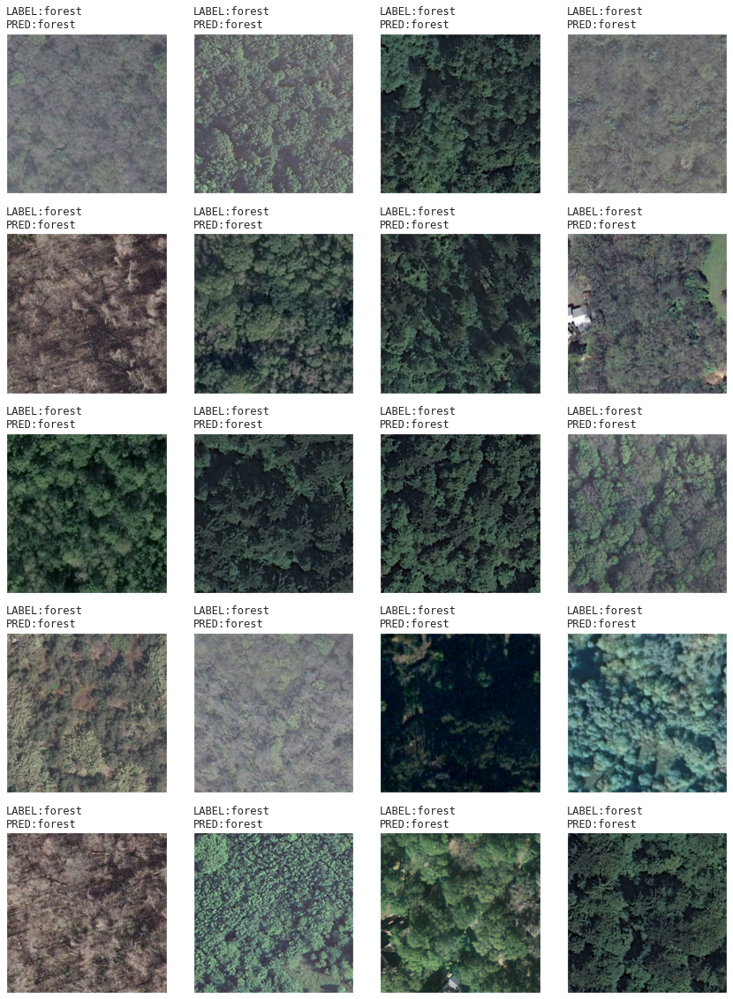


Category:mobilehomepark, Total Samples:20


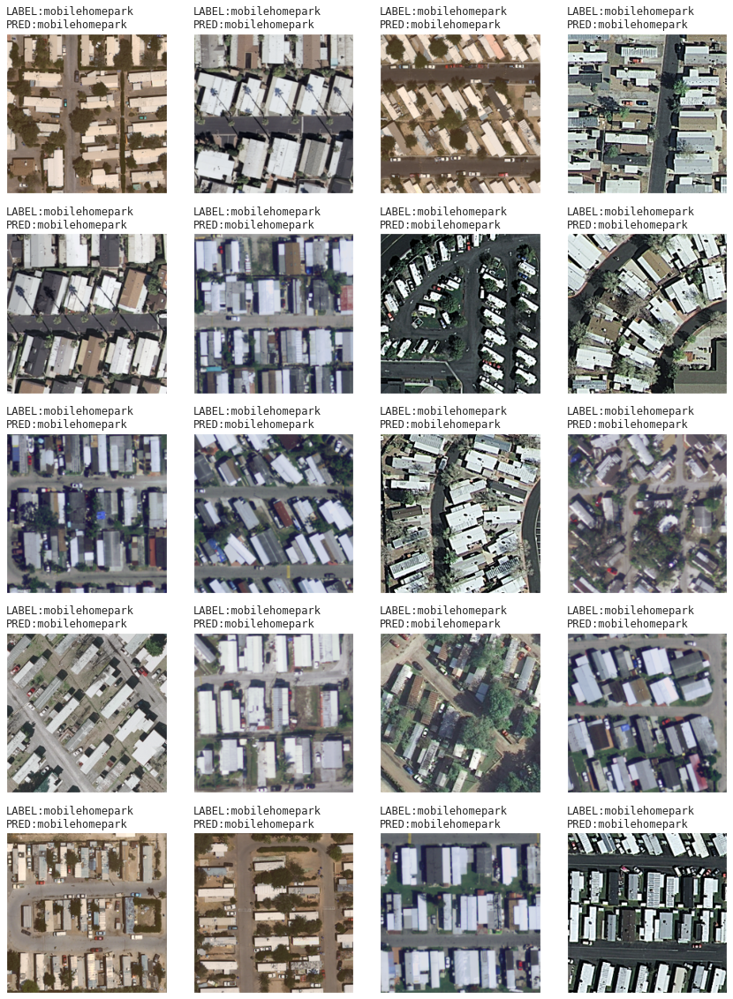


Category:overpass, Total Samples:20


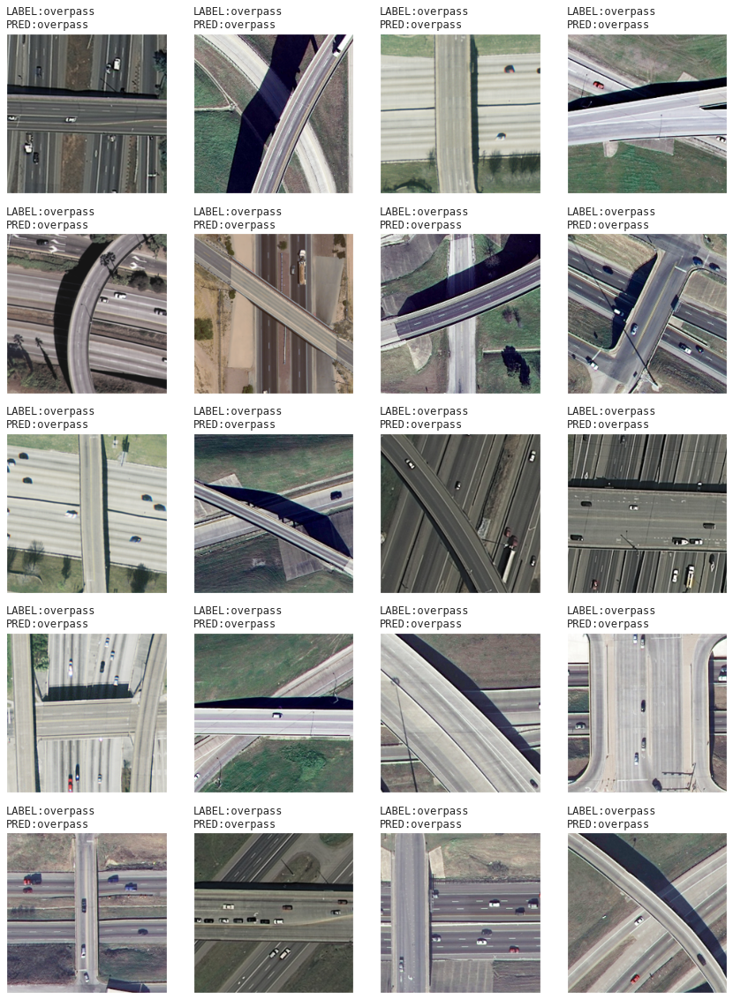


Category:parkinglot, Total Samples:20


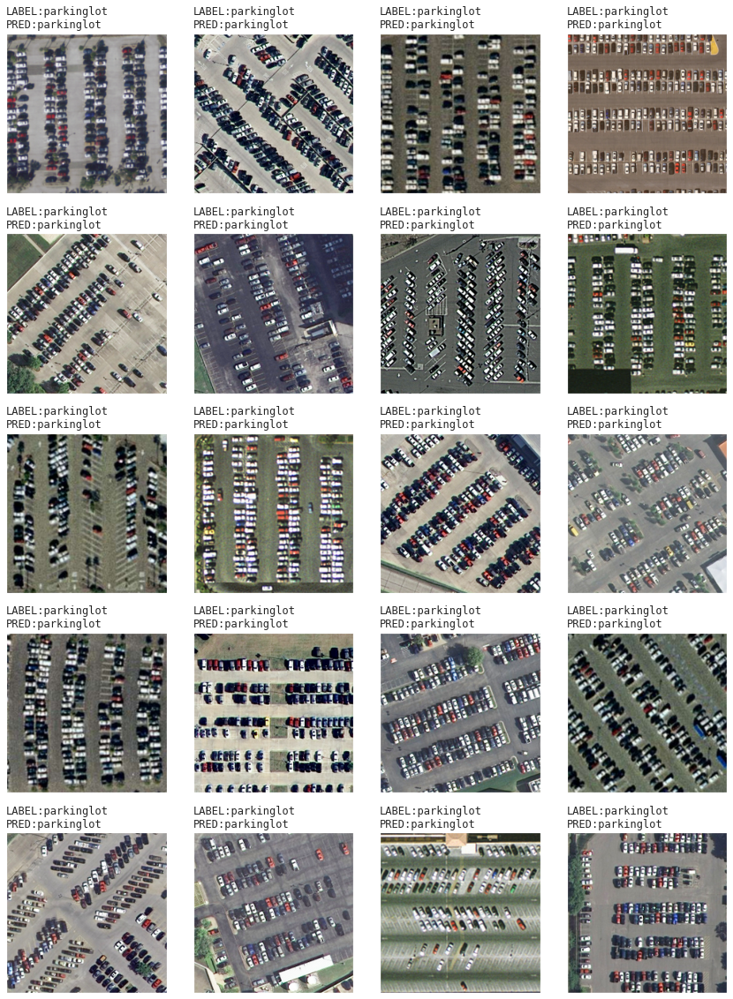


Category:river, Total Samples:20


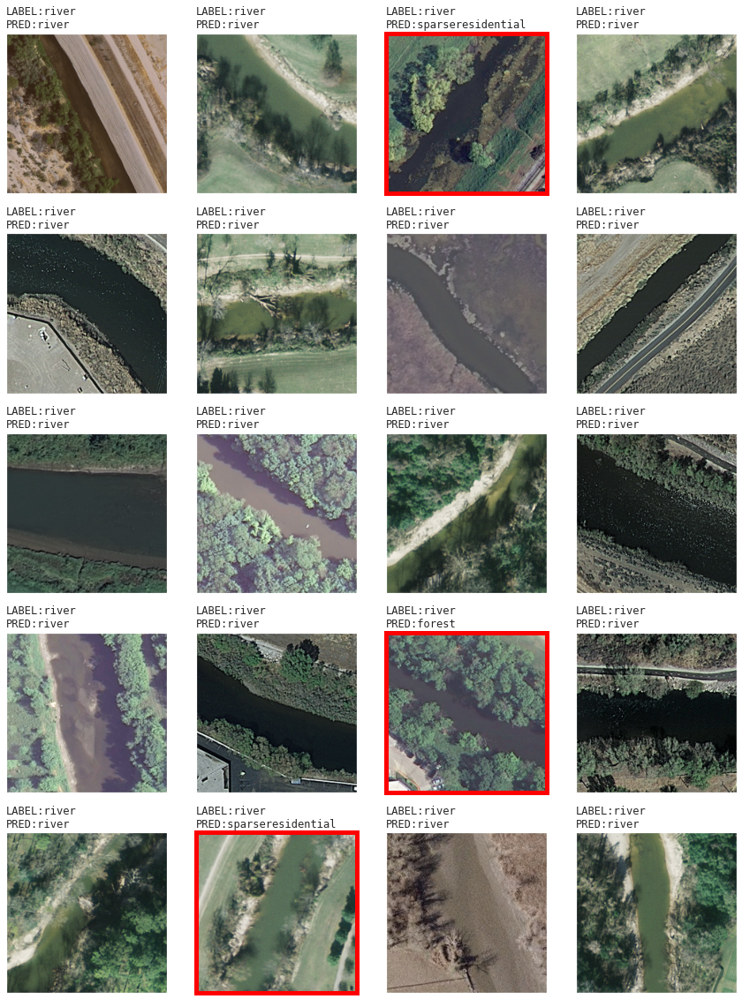


Category:runway, Total Samples:20


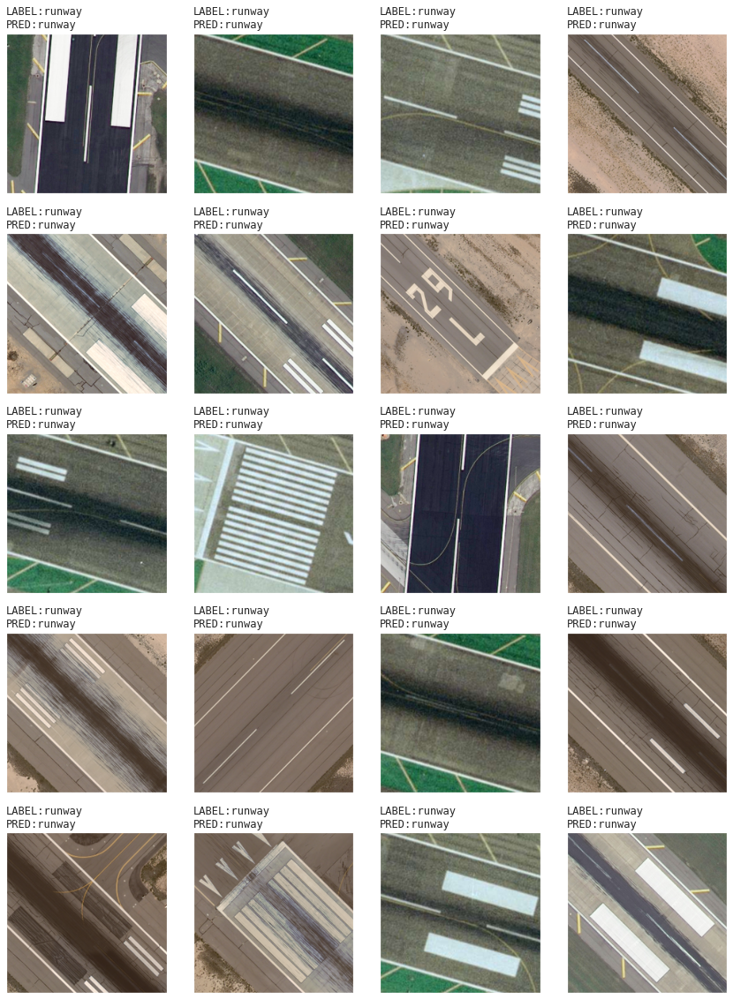


Category:sparseresidential, Total Samples:20


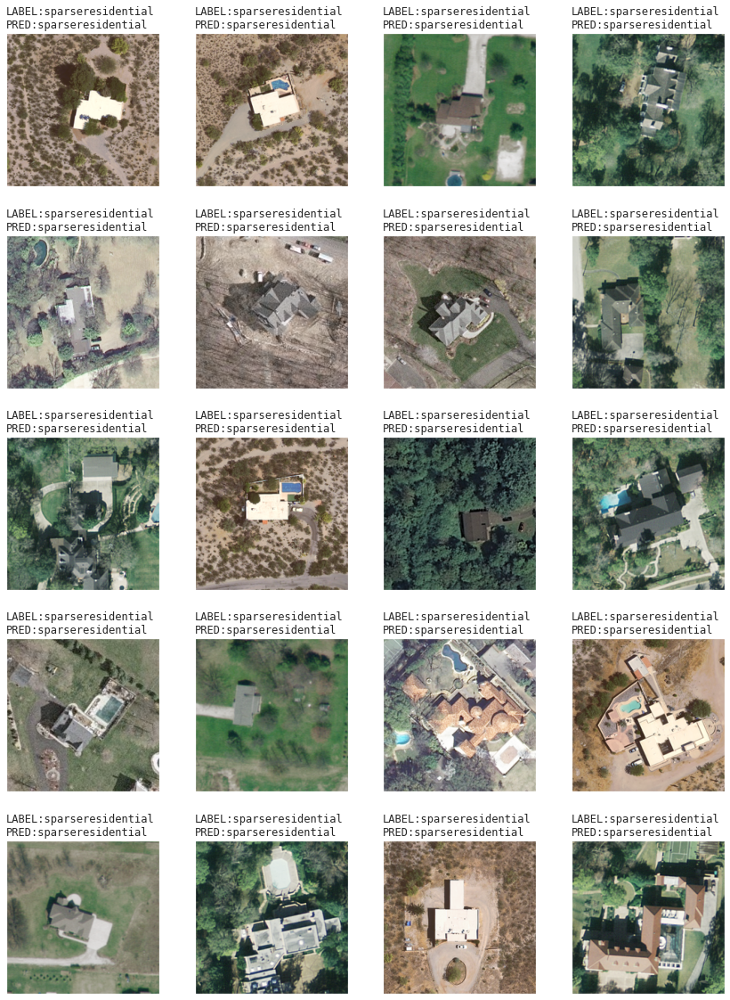

In [21]:
for i in range(len(category_names)):
    cat=[]
    cat_pred=[]
    x_test_cat=[]
    for j in range(len(y_test)):
        if y_test.argmax(axis=1)[j]==i:
            cat.append(category_names[i])
            cat_pred.append(
                category_names[predictions.argmax(axis=1)[j]])
            x_test_cat.append(x_test[j])
            
    print('\nCategory:{}, Total Samples:{}'.format(
        category_names[i],len(cat)))
    
    plotImages_categories(images=x_test_cat,
                          labels=cat,
                          predictions=cat_pred,
                          figsize=(12,16))